In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, roc_curve, auc
)
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

In [ ]:
from google.colab import drive
drive.mount('/content/my-drive')

Drive already mounted at /content/my-drive; to attempt to forcibly remount, call drive.mount("/content/my-drive", force_remount=True).


In [ ]:
# /content/my-drive/MyDrive/logistic_regression (1).csv
data =pd.read_csv(r"/content/my-drive/MyDrive/logistic_regression (1).csv")
data.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [ ]:
# Shape of the dataset -
print("No. of rows: ", data.shape[0])
print("No. of columns: ", data.shape[1])

No. of rows:  396030
No. of columns:  27


In [ ]:
# Checking the distribution of outcome labels -
data.loan_status.value_counts(normalize=True)*100

loan_status
Fully Paid     80.387092
Charged Off    19.612908
Name: proportion, dtype: float64

There is a good amount of imabalance in the target outcomes, this implies accuracy metric will not be a good option to evaluate our model.

First let I will fit a model with the same imbalanced data and check for evaulation metrics then after that I will fit model on the dataset to which I am going to oversample it for reducing the imbalance of the minority class.

In [ ]:
# Statistical summary of the dataset -
data.describe(include='all')

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
count,396030.000000,396030,396030.000000,396030.000000,396030,396030,373103,377729,396030,3.960300e+05,396030,396030,396030,396030,394274,396030.000000,396030,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,396030,396030,358235.000000,395495.000000,396030
unique,NaN,2,NaN,NaN,7,35,173105,11,6,NaN,3,115,2,14,48816,NaN,684,NaN,NaN,NaN,NaN,NaN,2,3,NaN,NaN,393700
top,NaN,36 months,NaN,NaN,B,B3,Teacher,10+ years,MORTGAGE,NaN,Verified,Oct-2014,Fully Paid,debt_consolidation,Debt consolidation,NaN,Oct-2000,NaN,NaN,NaN,NaN,NaN,f,INDIVIDUAL,NaN,NaN,USCGC Smith\r\nFPO AE 70466
freq,NaN,302005,NaN,NaN,116018,26655,4389,126041,198348,NaN,139563,14846,318357,234507,152472,NaN,3017,NaN,NaN,NaN,NaN,NaN,238066,395319,NaN,NaN,8
mean,14113.888089,NaN,13.639400,431.849698,NaN,NaN,NaN,NaN,NaN,7.420318e+04,NaN,NaN,NaN,NaN,NaN,17.379514,NaN,11.311153,0.178191,1.584454e+04,53.791749,25.414744,NaN,NaN,1.813991,0.121648,NaN
std,8357.441341,NaN,4.472157,250.727790,NaN,NaN,NaN,NaN,NaN,6.163762e+04,NaN,NaN,NaN,NaN,NaN,18.019092,NaN,5.137649,0.530671,2.059184e+04,24.452193,11.886991,NaN,NaN,2.147930,0.356174,NaN
min,500.000000,NaN,5.320000,16.080000,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000e+00,0.000000,2.000000,NaN,NaN,0.000000,0.000000,NaN
25%,8000.000000,NaN,10.490000,250.330000,NaN,NaN,NaN,NaN,NaN,4.500000e+04,NaN,NaN,NaN,NaN,NaN,11.280000,NaN,8.000000,0.000000,6.025000e+03,35.800000,17.000000,NaN,NaN,0.000000,0.000000,NaN
50%,12000.000000,NaN,13.330000,375.430000,NaN,NaN,NaN,NaN,NaN,6.400000e+04,NaN,NaN,NaN,NaN,NaN,16.910000,NaN,10.000000,0.000000,1.118100e+04,54.800000,24.000000,NaN,NaN,1.000000,0.000000,NaN
75%,20000.000000,NaN,16.490000,567.300000,NaN,NaN,NaN,NaN,NaN,9.000000e+04,NaN,NaN,NaN,NaN,NaN,22.980000,NaN,14.000000,0.000000,1.962000e+04,72.900000,32.000000,NaN,NaN,3.000000,0.000000,NaN


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394274 non-null  object 
 15  

#### Correlation Heatmap -

A correlation heatmap is a heatmap that shows a 2D correlation matrix between two discrete dimensions, using colored cells to represent data from usually a monochromatic scale. The values of the first dimension appear as the rows of the table while of the second dimension as a column. The color of the cell is proportional to the number of measurements that match the dimensional value. This makes correlation heatmaps ideal for data analysis since it makes patterns easily readable and highlights the differences and variation in the same data. A correlation heatmap, like a regular heatmap, is assisted by a colorbar making data easily readable and comprehensible.

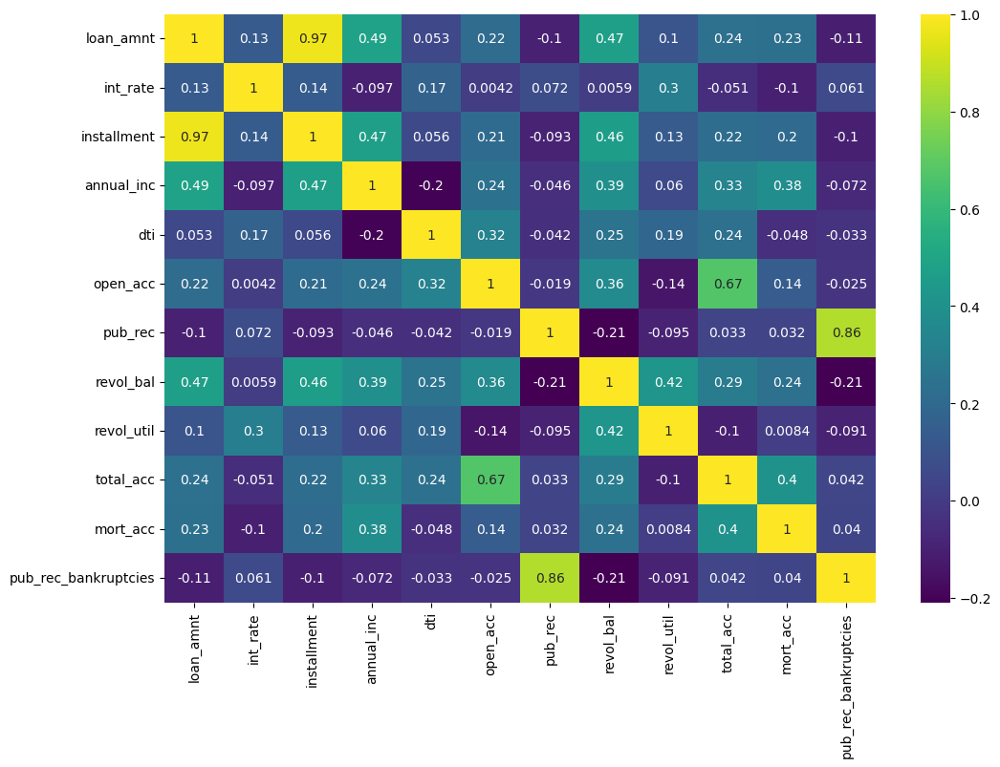

In [ ]:
# Handle non-numerical columns before calculating correlations
data_numeric = data.select_dtypes(include=['float', 'int'])  # Select only numerical columns

plt.figure(figsize=(12, 8))
sns.heatmap(data_numeric.corr(method='spearman'), annot=True, cmap='viridis')
plt.show()

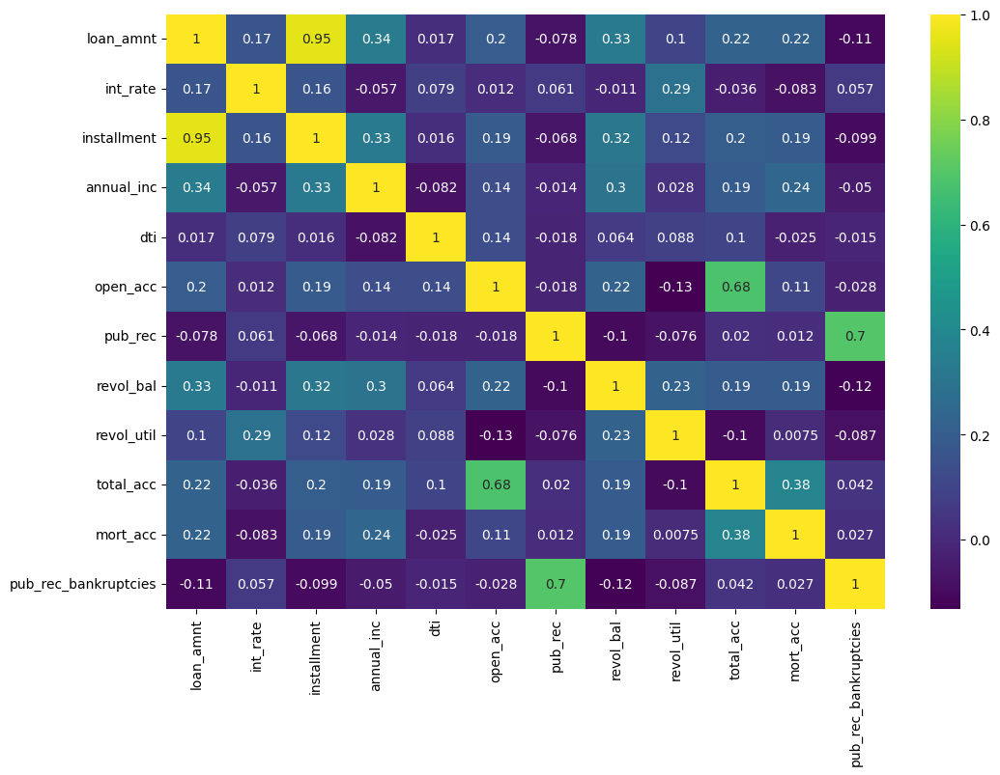

In [ ]:
# Handle non-numerical columns before calculating correlations
data_numeric = data.select_dtypes(include=['float', 'int'])  # Select only numerical columns

plt.figure(figsize=(12, 8))
sns.heatmap(data_numeric.corr(method='pearson'), annot=True, cmap='viridis')
plt.show()

We noticed almost perfect correlation between "loan_amnt" the "installment" feature.

As you can see both spearman and pearson correlation values are almost equal which says that there might be a presence of slight to no non-linearity in the features.

The installment amount and loan amount are highly correlated which has correlation of over 0.95 so we can remove any one of the 2 features.

- installment: The monthly payment owed by the borrower if the loan originates.
- loan_amnt: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

So, we can drop either one of those columns.

In [ ]:
data.drop(columns=['installment'], axis=1, inplace=True)

In [ ]:
# # Handle non-numerical columns before calculating correlations
# data_numeric = data.select_dtypes(include=['float', 'int'])  # Select only numerical columns

# plt.figure(figsize=(12, 8))
# sns.heatmap(data_numeric.corr(method='spearman'), annot=True, cmap='viridis')
# plt.show()

In [ ]:
# Cleaning individual columns
# term
data['term']=data['term'].str.strip()
map = {'36 months':36,'60 months':60}
data['term']=data['term'].map(map)

In [ ]:
# grade
data['grade'].value_counts()

grade
B    116018
C    105987
A     64187
D     63524
E     31488
F     11772
G      3054
Name: count, dtype: int64

In [ ]:
# emp_length
data['emp_length'].value_counts()
data['emp_length']=data['emp_length'].str.strip()
map = {'10+ years':10,'2 years':2,'< 1 year':1,'3 years':3,'5 years':5,'6 years':6,
      '4 years':4,'1 year':1,'7 years':7,'8 years':8,'9 years':9}
data['emp_length']=data['emp_length'].map(map)

In [ ]:
data['home_ownership'].value_counts()

data.loc[(data['home_ownership']=='NONE') |(data['home_ownership']=='ANY'),'home_ownership']='OTHER'

In [ ]:
data['home_ownership'].value_counts()

home_ownership
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: count, dtype: int64

In [ ]:
data['verification_status']=data['verification_status'].str.strip()
data['verification_status'].value_counts()

verification_status
Verified           139563
Source Verified    131385
Not Verified       125082
Name: count, dtype: int64

In [ ]:
# Since the full address is not of use to us let's extarct zipcode

data['zipcode']=data['address'].apply(lambda x:x[-5:])

In [ ]:
data.drop(columns=['address'],inplace=True)

In [ ]:
data['grade'].value_counts()
data['grade']=pd.Categorical(data['grade'],categories=['A','B','C','D','E','F','G'],ordered=True)

In [ ]:
# Sub-grade
data['sub_grade'].value_counts()
data['sub_grade']=pd.Categorical(data['sub_grade'],categories=['A1','A2','A3','A4','A5','B1','B2','B3',
                                          'B4','B5','C1','C2','C3','C4','C5','D1',
                                          'D2','D3','D4','D5','E1','E2','E3','E4',
                                          'E5','F1','F2','F3','F4','F5','G1','G2',
                                           'G3','G4','G5'
                                          ],ordered=True)

In [ ]:
data['verification_status']=data['verification_status'].astype('category')

# Converting issue_d and earliest_cr_line from string to datetime
data['issue_d']=pd.to_datetime(data['issue_d'])
data['earliest_cr_line']=pd.to_datetime(data['earliest_cr_line'])

<ipython-input-88-aa8ab7d1501f>:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['issue_d']=pd.to_datetime(data['issue_d'])
<ipython-input-88-aa8ab7d1501f>:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['earliest_cr_line']=pd.to_datetime(data['earliest_cr_line'])


In [ ]:
pd.set_option('display.max_columns', None)
data.head()

,loan_amnt,term,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,zipcode
0,10000.0,36,11.44,B,B4,Marketing,10.0,RENT,117000.0,Not Verified,2015-01-01,Fully Paid,vacation,Vacation,26.24,1990-06-01,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,22690
1,8000.0,36,11.99,B,B5,Credit analyst,4.0,MORTGAGE,65000.0,Not Verified,2015-01-01,Fully Paid,debt_consolidation,Debt consolidation,22.05,2004-07-01,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,05113
2,15600.0,36,10.49,B,B3,Statistician,1.0,RENT,43057.0,Source Verified,2015-01-01,Fully Paid,credit_card,Credit card refinancing,12.79,2007-08-01,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,05113
3,7200.0,36,6.49,A,A2,Client Advocate,6.0,RENT,54000.0,Not Verified,2014-11-01,Fully Paid,credit_card,Credit card refinancing,2.60,2006-09-01,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,00813
4,24375.0,60,17.27,C,C5,Destiny Management Inc.,9.0,MORTGAGE,55000.0,Verified,2013-04-01,Charged Off,credit_card,Credit Card Refinance,33.95,1999-03-01,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,11650


In [ ]:
data['title'].value_counts()
data['purpose'].value_counts()

purpose
debt_consolidation    234507
credit_card            83019
home_improvement       24030
other                  21185
major_purchase          8790
small_business          5701
car                     4697
medical                 4196
moving                  2854
vacation                2452
house                   2201
wedding                 1812
renewable_energy         329
educational              257
Name: count, dtype: int64

Purpose and title give the same info and since there are many titles due to manual typing error we can drop that column.

In [ ]:
data.drop(columns=['title'],inplace=True)

In [ ]:
data['application_type'].value_counts()

application_type
INDIVIDUAL    395319
JOINT            425
DIRECT_PAY       286
Name: count, dtype: int64

In [ ]:
data['application_type'].astype('category')

0         INDIVIDUAL
1         INDIVIDUAL
2         INDIVIDUAL
3         INDIVIDUAL
4         INDIVIDUAL
5         INDIVIDUAL
6         INDIVIDUAL
7         INDIVIDUAL
8         INDIVIDUAL
9         INDIVIDUAL
10        INDIVIDUAL
11        INDIVIDUAL
12             JOINT
13        INDIVIDUAL
14        INDIVIDUAL
15        INDIVIDUAL
16        INDIVIDUAL
17        INDIVIDUAL
18        INDIVIDUAL
19        INDIVIDUAL
20        INDIVIDUAL
21        INDIVIDUAL
22        INDIVIDUAL
23        INDIVIDUAL
24        INDIVIDUAL
25        INDIVIDUAL
26        INDIVIDUAL
27        INDIVIDUAL
28        INDIVIDUAL
29        INDIVIDUAL
30        INDIVIDUAL
31        INDIVIDUAL
32        INDIVIDUAL
33        INDIVIDUAL
34        INDIVIDUAL
35        INDIVIDUAL
36        INDIVIDUAL
37        INDIVIDUAL
38        INDIVIDUAL
39        INDIVIDUAL
40        INDIVIDUAL
41        INDIVIDUAL
42        INDIVIDUAL
43        INDIVIDUAL
44        INDIVIDUAL
45        INDIVIDUAL
46        INDIVIDUAL
47        IND

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             396030 non-null  float64       
 1   term                  396030 non-null  int64         
 2   int_rate              396030 non-null  float64       
 3   grade                 396030 non-null  category      
 4   sub_grade             396030 non-null  category      
 5   emp_title             373103 non-null  object        
 6   emp_length            377729 non-null  float64       
 7   home_ownership        396030 non-null  object        
 8   annual_inc            396030 non-null  float64       
 9   verification_status   396030 non-null  category      
 10  issue_d               396030 non-null  datetime64[ns]
 11  loan_status           396030 non-null  object        
 12  purpose               396030 non-null  object        
 13 

### Data Exploration -
1. The no of people those who have fully paid are 318357 and that of Charged Off are 77673.

In [ ]:
data.groupby(by='loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,77673.0,15126.300967,8505.090557,1000.0,8525.0,14000.0,20000.0,40000.0
Fully Paid,318357.0,13866.878771,8302.319699,500.0,7500.0,12000.0,19225.0,40000.0


2. The majority of people have home ownership as Mortgage and Rent.

In [ ]:
data['home_ownership'].value_counts()

home_ownership
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: count, dtype: int64

3. Combininging the minority classes as 'OTHER'.

In [ ]:
data.loc[(data.home_ownership == 'ANY') | (data.home_ownership == 'NONE'), 'home_ownership'] = 'OTHER'
data.home_ownership.value_counts()

home_ownership
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: count, dtype: int64

In [ ]:
data['home_ownership'].value_counts()

home_ownership
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: count, dtype: int64

In [ ]:
# Checking the distribution of 'Other' -
data.loc[data['home_ownership']=='OTHER', 'loan_status'].value_counts()

loan_status
Fully Paid     123
Charged Off     23
Name: count, dtype: int64

4. Coverting string to date-time format.


In [ ]:
data['issue_d'] = pd.to_datetime(data['issue_d'])
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])

5. Saw some issues in title (Looks like it was filled manually and needs some fixing).

### Visualization -
The grade of majority of people those who have fully paid the loan is 'B' and have subgrade 'B3'.

So from where we can infer that people with grade 'B' and subgrade 'B3' are more likely to fully pay the loan.

<ipython-input-101-436f83565516>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(), rotation=90);


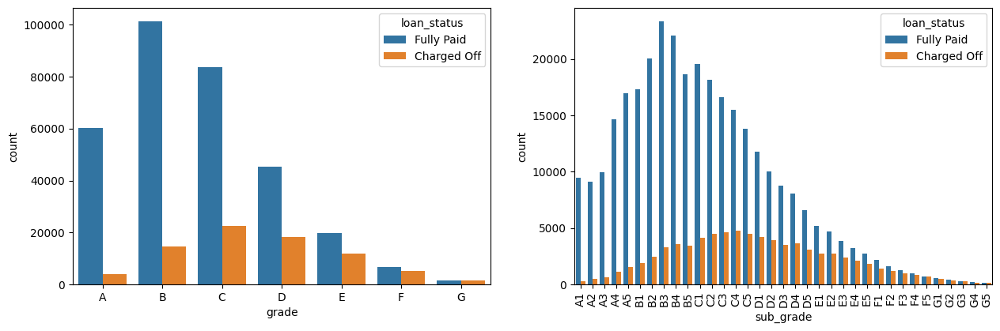

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(data.grade.unique().tolist())
sns.countplot(x='grade', data=data, hue='loan_status', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(data.sub_grade.unique().tolist())
g = sns.countplot(x='sub_grade', data=data, hue='loan_status', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

<ipython-input-102-62191b24ebc8>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(), rotation=90);


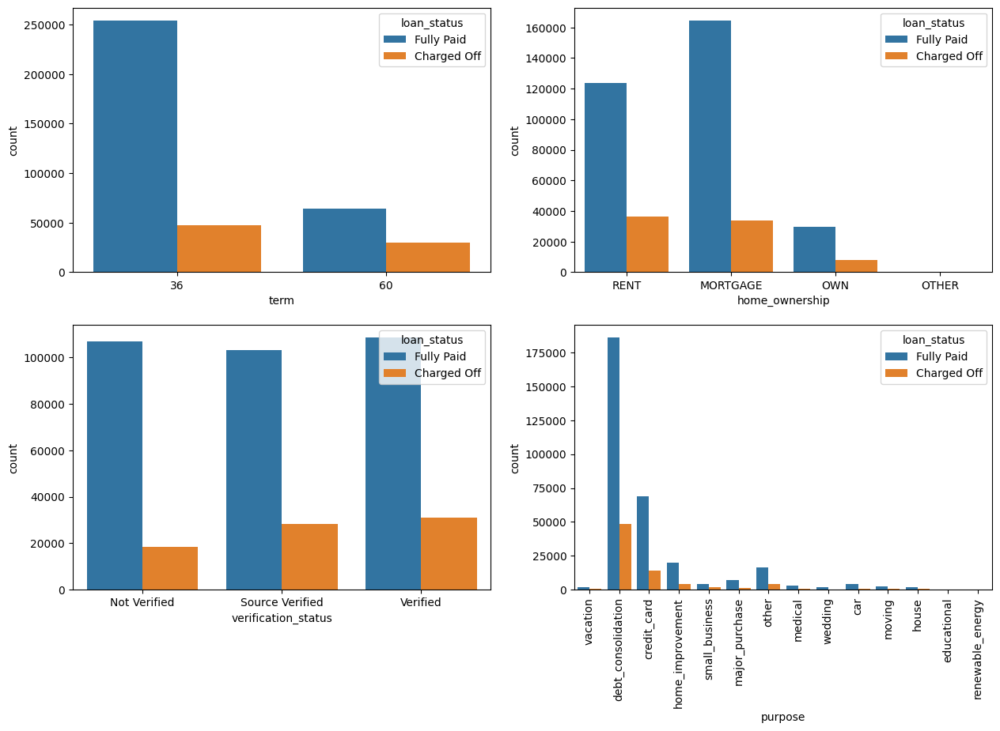

In [ ]:
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.countplot(x='term', data=data, hue='loan_status')

plt.subplot(4, 2, 2)
sns.countplot(x='home_ownership', data=data, hue='loan_status')

plt.subplot(4, 2, 3)
sns.countplot(x='verification_status', data=data, hue='loan_status')

plt.subplot(4, 2, 4)
g = sns.countplot(x='purpose', data=data, hue='loan_status')
g.set_xticklabels(g.get_xticklabels(), rotation=90);

<ipython-input-103-34ebc1631d63>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(), rotation=90);


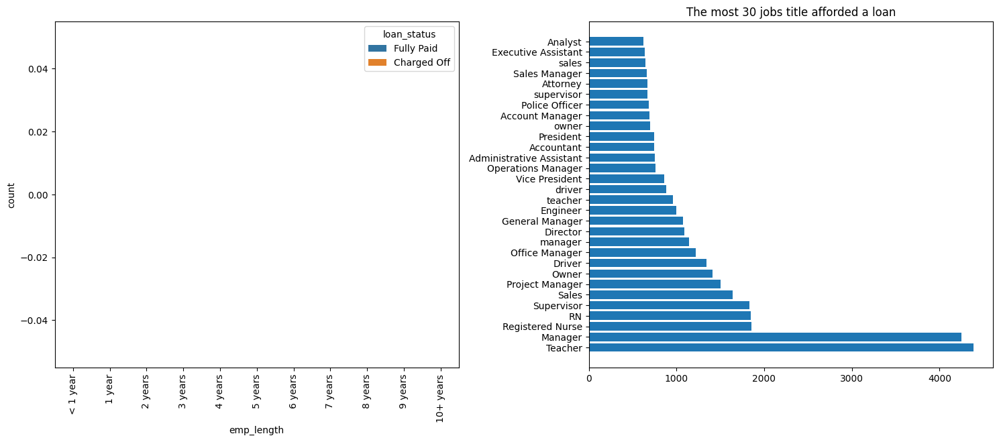

In [ ]:
plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years',
          '6 years', '7 years', '8 years', '9 years', '10+ years',]
g = sns.countplot(x='emp_length', data=data, hue='loan_status', order=order)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

plt.subplot(2, 2, 2)
plt.barh(data.emp_title.value_counts()[:30].index, data.emp_title.value_counts()[:30])
plt.title("The most 30 jobs title afforded a loan")
plt.tight_layout()

Manager and Teacher are the most afforded loan job titles.

### Feature Engineering -

In [ ]:
def pub_rec(number):
    if number == 0.0:
        return 0
    else:
        return 1

def mort_acc(number):
    if number == 0.0:
        return 0
    else:
        return 1


def pub_rec_bankruptcies(number):
    if number == 0.0:
        return 0
    else:
        return 1

In [ ]:
data['pub_rec'] = data.pub_rec.apply(pub_rec)
data['mort_acc'] = data.mort_acc.apply(mort_acc)
data['pub_rec_bankruptcies'] = data.pub_rec_bankruptcies.apply(pub_rec_bankruptcies)

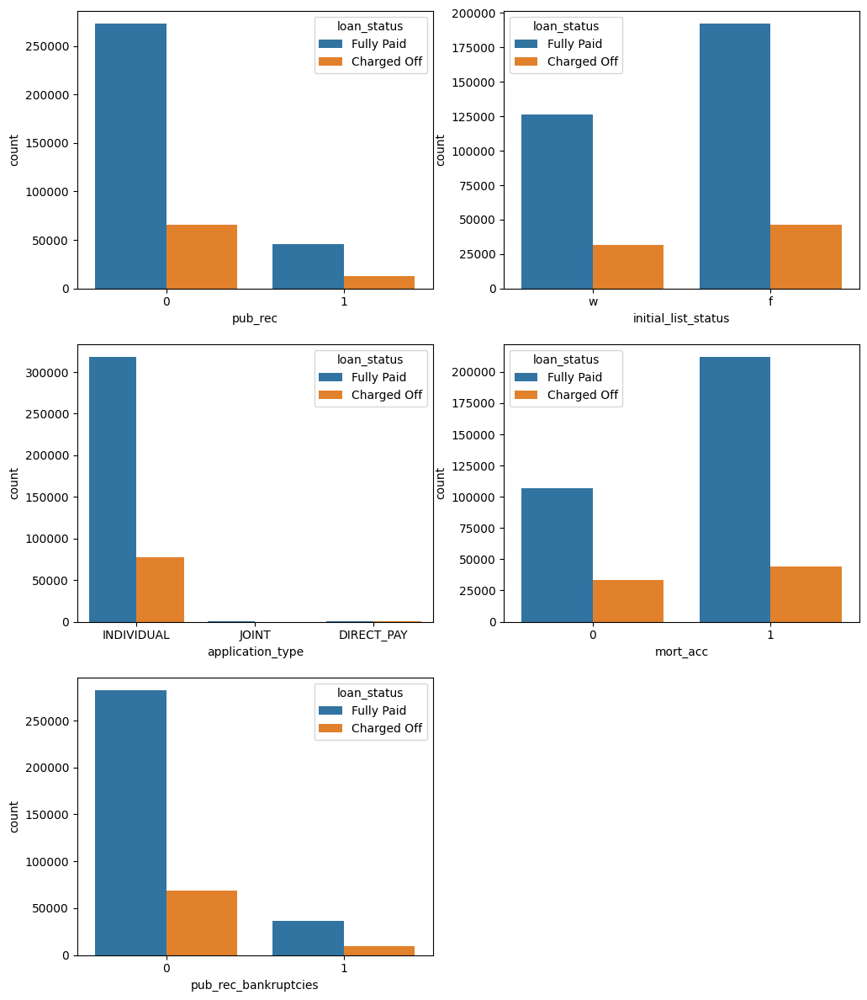

In [ ]:
plt.figure(figsize=(12, 30))

plt.subplot(6, 2, 1)
sns.countplot(x='pub_rec', data=data, hue='loan_status')

plt.subplot(6, 2, 2)
sns.countplot(x='initial_list_status', data=data, hue='loan_status')

plt.subplot(6, 2, 3)
sns.countplot(x='application_type', data=data, hue='loan_status')

plt.subplot(6, 2, 4)
sns.countplot(x='mort_acc', data=data, hue='loan_status')

plt.subplot(6, 2, 5)
sns.countplot(x='pub_rec_bankruptcies', data=data, hue='loan_status')

plt.show()

In [ ]:
# Mapping of target variable -
data['loan_status'] = data.loan_status.map({'Fully Paid':0, 'Charged Off':1})

In [ ]:
data.isnull().sum()/len(data)*100

loan_amnt               0.000000
term                    0.000000
int_rate                0.000000
grade                   0.000000
sub_grade               0.000000
emp_title               5.789208
emp_length              4.621115
home_ownership          0.000000
annual_inc              0.000000
verification_status     0.000000
issue_d                 0.000000
loan_status             0.000000
purpose                 0.000000
dti                     0.000000
earliest_cr_line        0.000000
open_acc                0.000000
pub_rec                 0.000000
revol_bal               0.000000
revol_util              0.069692
total_acc               0.000000
initial_list_status     0.000000
application_type        0.000000
mort_acc                0.000000
pub_rec_bankruptcies    0.000000
zipcode                 0.000000
dtype: float64

### Very Important: Mean Target Imputation

In [ ]:
# data.drop(columns=['term'], axis=1, inplace=True)

In [ ]:
# Convert 'term' column to string type before using .str accessor
# data['term'] = data['term'].astype(str)

# Convert 'term' column to numeric by extracting the number
# data['term'] = data['term'].str.extract('(\d+)').astype(float)

# Select only numeric columns for the mean calculation
numeric_data = data.select_dtypes(include=['number'])

# Now calculate the mean for numeric columns
numeric_data.groupby(by='total_acc').mean()

,loan_amnt,term,int_rate,emp_length,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,mort_acc,pub_rec_bankruptcies
total_acc,,,,,,,,,,,,,
2.0,6672.222222,38.666667,15.801111,3.666667,64277.777778,0.222222,2.279444,1.611111,0.000000,2860.166667,53.527778,0.111111,0.111111
3.0,6042.966361,38.935780,15.615566,3.051613,41270.753884,0.220183,6.502813,2.611621,0.033639,3382.807339,49.991022,0.495413,0.027523
4.0,7587.399031,38.462036,15.069491,3.754296,42426.565969,0.214055,8.411963,3.324717,0.033118,4874.231826,58.477400,0.341680,0.033926
5.0,7845.734714,38.899408,14.917564,3.890116,44394.098003,0.203156,10.118328,3.921598,0.055720,5475.253452,56.890311,0.318540,0.044872
6.0,8529.019843,38.725966,14.651752,4.273324,48470.001156,0.215874,11.222542,4.511119,0.076634,6546.374957,57.812483,0.303113,0.056791
7.0,9350.283611,39.035482,14.415810,4.374585,50623.501002,0.211200,11.829829,5.093169,0.087618,7363.941588,56.787540,0.324885,0.063963
8.0,9788.345760,39.207456,14.271851,4.772467,52571.393657,0.217707,12.684623,5.576887,0.108481,7850.161603,57.348173,0.355638,0.081640
9.0,10042.600597,39.402704,14.244870,4.838948,52572.312693,0.213141,13.296349,6.028765,0.121031,8205.770041,56.583065,0.367494,0.091481
10.0,10487.255605,39.534932,14.109811,5.027809,55751.004093,0.205553,14.004592,6.466111,0.121741,9124.531283,57.029202,0.379171,0.091632


In [ ]:
total_acc_avg = numeric_data.groupby(by='total_acc').mean().mort_acc
# Saving mean of mort_acc according to total_acc_avg (you can pick any variable for your understanding)

In [ ]:
def fill_mort_acc(total_acc, mort_acc):
    if np.isnan(mort_acc):
        return total_acc_avg[total_acc].round()
    else:
        return mort_acc

In [ ]:
data['mort_acc'] = data.apply(lambda x: fill_mort_acc(x['total_acc'], x['mort_acc']), axis=1)

In [ ]:
data.isnull().sum()/len(data)*100

loan_amnt               0.000000
term                    0.000000
int_rate                0.000000
grade                   0.000000
sub_grade               0.000000
emp_title               5.789208
emp_length              4.621115
home_ownership          0.000000
annual_inc              0.000000
verification_status     0.000000
issue_d                 0.000000
loan_status             0.000000
purpose                 0.000000
dti                     0.000000
earliest_cr_line        0.000000
open_acc                0.000000
pub_rec                 0.000000
revol_bal               0.000000
revol_util              0.069692
total_acc               0.000000
initial_list_status     0.000000
application_type        0.000000
mort_acc                0.000000
pub_rec_bankruptcies    0.000000
zipcode                 0.000000
dtype: float64

In [ ]:
# Current no. of rows -
data.shape

(396030, 25)

In [ ]:
# Dropping rows with null values -
data.dropna(inplace=True)

In [ ]:
# Remaining no. of rows -
data.shape

(372665, 25)

In [ ]:
numerical_data = data.select_dtypes(include='number')
num_cols = numerical_data.columns
len(num_cols)

14

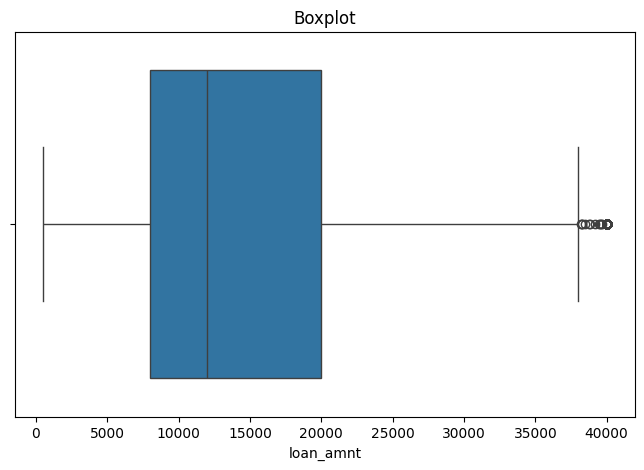

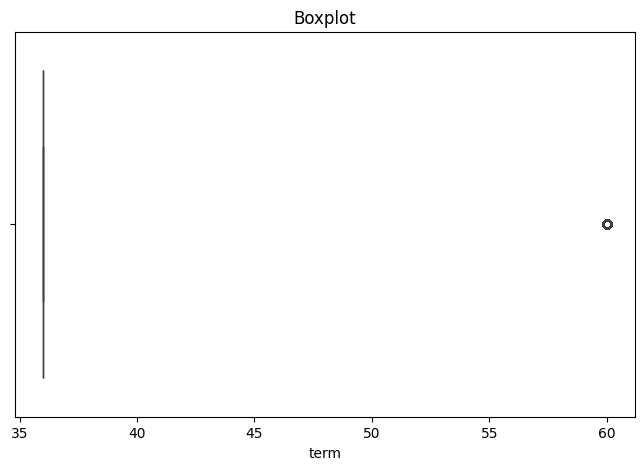

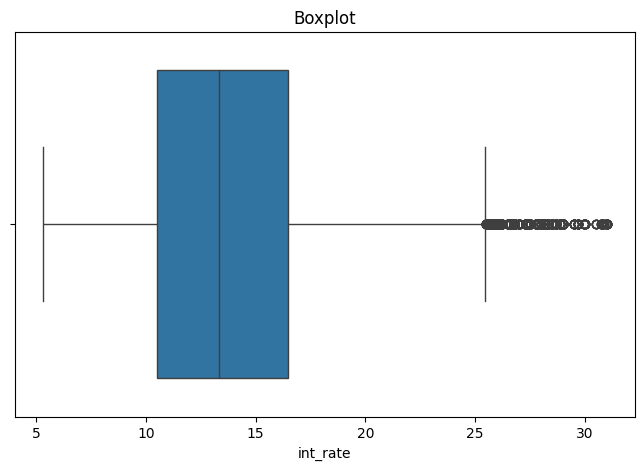

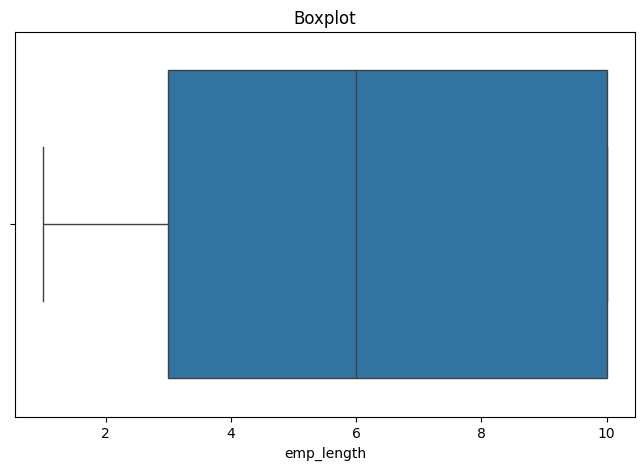

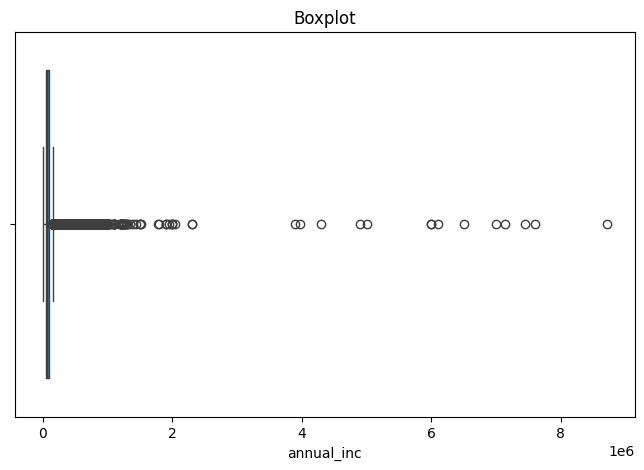

...

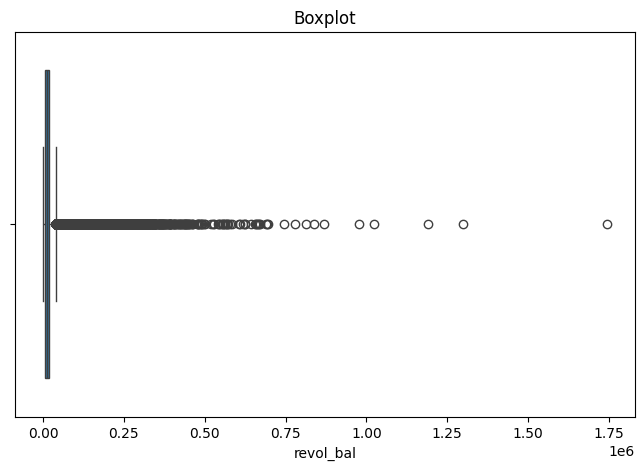

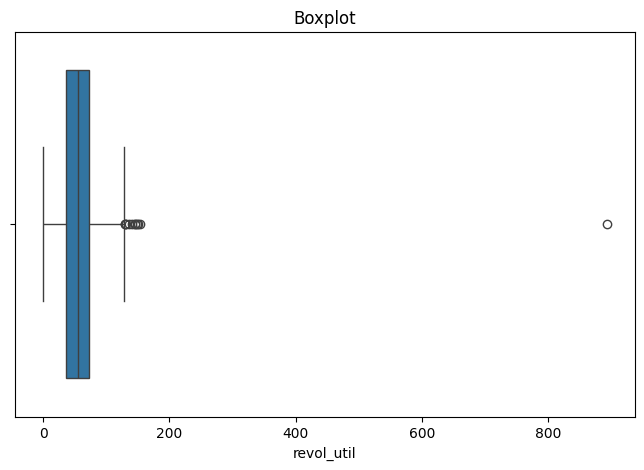

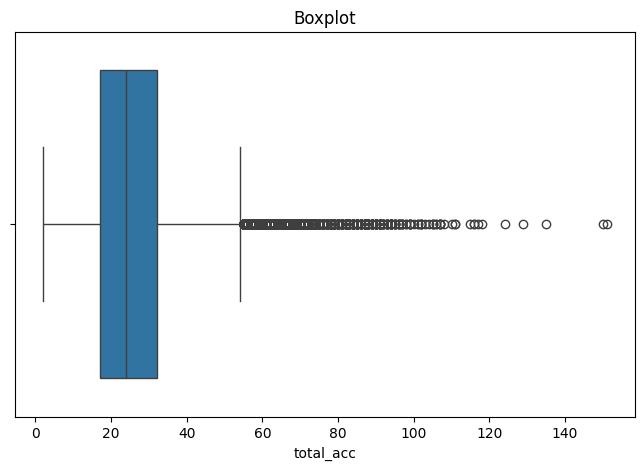

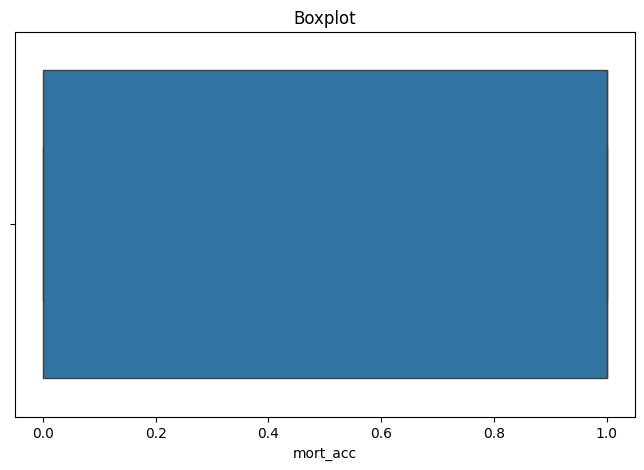

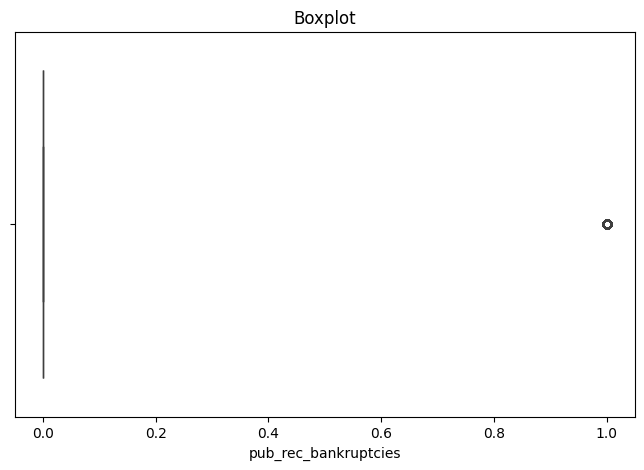

In [ ]:
def box_plot(col):
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=data[col])
    plt.title('Boxplot')
    plt.show()

for col in num_cols:
    box_plot(col)

In [ ]:
for col in num_cols:
    mean = data[col].mean()
    std = data[col].std()

    upper_limit = mean+3*std
    lower_limit = mean-3*std

    data = data[(data[col]<upper_limit) & (data[col]>lower_limit)]

data.shape

(356428, 25)

In [ ]:
# Dropping some variables which IMO we can let go for now -
data.drop(columns=['issue_d', 'emp_title', 'sub_grade',
                 'earliest_cr_line', 'emp_length'],
                   axis=1, inplace=True)

In [ ]:
dummies = ['purpose', 'grade', 'verification_status', 'application_type', 'home_ownership']
data = pd.get_dummies(data, columns=dummies, drop_first=True)

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

data.head()

,loan_amnt,term,int_rate,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies,zipcode,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,verification_status_Source Verified,verification_status_Verified,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
0,10000.0,36,11.44,117000.0,0,26.24,16.0,0,36369.0,41.8,25.0,w,0,0,22690,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,True,False,False,False,True
1,8000.0,36,11.99,65000.0,0,22.05,17.0,0,20131.0,53.3,27.0,f,1,0,05113,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False
2,15600.0,36,10.49,43057.0,0,12.79,13.0,0,11987.0,92.2,26.0,f,0,0,05113,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,True
3,7200.0,36,6.49,54000.0,0,2.60,6.0,0,5472.0,21.5,13.0,f,0,0,00813,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True
4,24375.0,60,17.27,55000.0,1,33.95,13.0,0,24584.0,69.8,43.0,f,1,0,11650,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,False,False


### Data Preprocessing -

#### One-hot Encoding -

### Data Preparation for Modeling -


In [138]:
X = data.drop(['loan_status', 'initial_list_status'], axis=1)
y = data['loan_status']

In [139]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,
                                                    stratify=y, random_state=42)

In [140]:
print(X_train.shape)
print(X_test.shape)

(249499, 39)
(106929, 39)


#### MinMaxScaler -

For each value in a feature, MinMaxScaler subtracts the minimum value in the feature and then divides by the range. The range is the difference between the original maximum and original minimum.

MinMaxScaler preserves the shape of the original distribution. It doesn’t meaningfully change the information embedded in the original data.

In [141]:
# X_train.info()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Logistic Regression

In [142]:
# # Handle missing values in X_train
# imputer = SimpleImputer(strategy='mean')  # Or another strategy like 'median'
# X_train_imputed = imputer.fit_transform(X_train)

# # Handle missing values in X_test
# X_test_imputed = imputer.fit_transform(X_test)

# # Scale the imputed data
# scaler = MinMaxScaler()
# X_train_scaled = scaler.fit_transform(X_train_imputed)
# X_test_scaled = scaler.fit_transform(X_test_imputed)

# Now fit the logistic regression model
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [145]:
y_pred = logreg.predict(X_test)
print('Accuracy of Logistic Regression Classifier on test set: {:.3f}'.format(logreg.score(X_test, y_test)))

Accuracy of Logistic Regression Classifier on test set: 0.841


#### Confusion Matrix -

In [146]:
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[83667  2694]
 [14302  6266]]


#### Classification Report -

In [147]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.97      0.91     86361
           1       0.70      0.30      0.42     20568

    accuracy                           0.84    106929
   macro avg       0.78      0.64      0.67    106929
weighted avg       0.82      0.84      0.81    106929



#### ROC Curve -

An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:

- True Positive Rate
- False Positive Rate

True Positive Rate (TPR) is a synonym for recall and is therefore defined as follows:

- TPR=(TP)/(TP+FN)

False Positive Rate (FPR) is defined as follows:

- FPR=(FP)/(FP+TN)

An ROC curve plots TPR vs. FPR at different classification thresholds. Lowering the classification threshold classifies more items as positive, thus increasing both False Positives and True Positives. The following figure shows a typical ROC curve.

#### AUC (Area under the ROC Curve) -

AUC stands for "Area under the ROC Curve." That is, AUC measures the entire two-dimensional area underneath the entire ROC curve (think integral calculus) from (0,0) to (1,1).


AUC provides an aggregate measure of performance across all possible classification thresholds. One way of interpreting AUC is as the probability that the model ranks a random positive example more highly than a random negative example. For example, given the following examples, which are arranged from left to right in ascending order of logistic regression predictions:

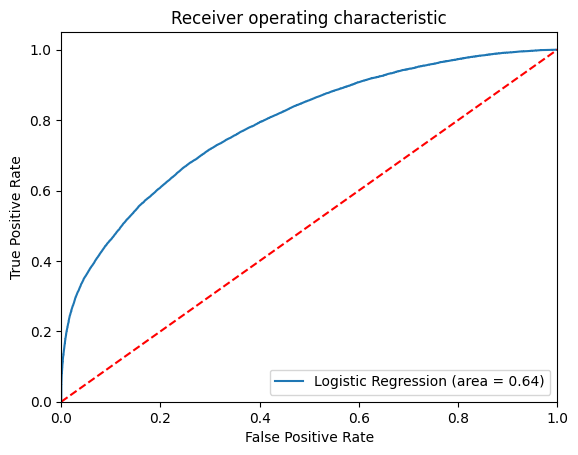

In [148]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

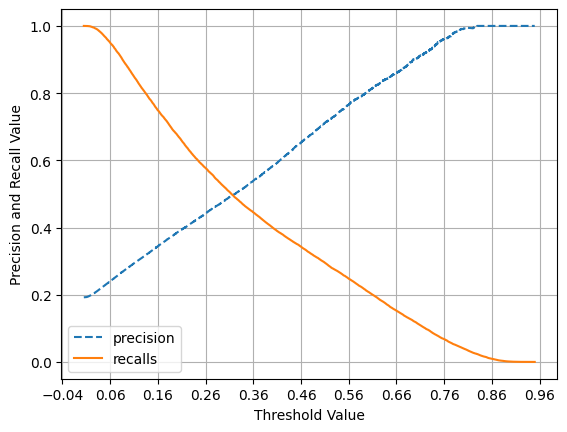

In [149]:
def precision_recall_curve_plot(y_test, pred_proba_c1):
    precisions, recalls, thresholds = precision_recall_curve(y_test, pred_proba_c1)

    threshold_boundary = thresholds.shape[0]
    # plot precision
    plt.plot(thresholds, precisions[0:threshold_boundary], linestyle='--', label='precision')
    # plot recall
    plt.plot(thresholds, recalls[0:threshold_boundary], label='recalls')

    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1), 2))

    plt.xlabel('Threshold Value'); plt.ylabel('Precision and Recall Value')
    plt.legend(); plt.grid()
    plt.show()

precision_recall_curve_plot(y_test, logreg.predict_proba(X_test)[:,1])

### Multicollinearity check using Variance Inflation Factor (VIF) -

Multicollinearity occurs when two or more independent variables are highly correlated with one another in a regression model. Multicollinearity can be a problem in a regression model because we would not be able to distinguish between the individual effects of the independent variables on the dependent variable.

Multicollinearity can be detected via various methods. One such method is Variance Inflation Factor aka VIF.
In VIF method, we pick each independent feature and regress it against all of the other independent features.
VIF score of an independent variable represents how well the variable is explained by other independent variables.

VIF = 1/1-R2

In [154]:
X = scaler.fit_transform(X)

kfold = KFold(n_splits=5)
accuracy = np.mean(cross_val_score(logreg, X, y, cv=kfold, scoring='accuracy', n_jobs=-1))
print("Cross Validation accuracy: {:.3f}".format(accuracy))

Cross Validation accuracy: 0.841


### Oversampling using SMOTE

In [156]:
sm = SMOTE(random_state=42)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

In [157]:
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

After OverSampling, the shape of train_X: (403016, 39)
After OverSampling, the shape of train_y: (403016,) 

After OverSampling, counts of label '1': 201508
After OverSampling, counts of label '0': 201508


In [159]:
lr1 = LogisticRegression(max_iter=1000)
lr1.fit(X_train_res, y_train_res)
predictions = lr1.predict(X_test)

# Classification Report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.91      0.73      0.81     86361
           1       0.38      0.69      0.49     20568

    accuracy                           0.72    106929
   macro avg       0.64      0.71      0.65    106929
weighted avg       0.81      0.72      0.75    106929



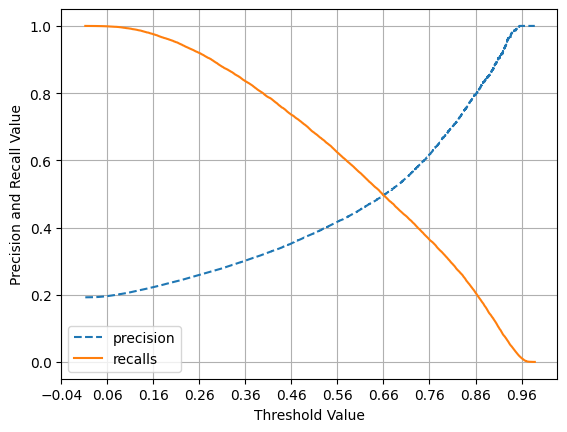

In [160]:
def precision_recall_curve_plot(y_test, pred_proba_c1):
    precisions, recalls, thresholds = precision_recall_curve(y_test, pred_proba_c1)

    threshold_boundary = thresholds.shape[0]
    # plot precision
    plt.plot(thresholds, precisions[0:threshold_boundary], linestyle='--', label='precision')
    # plot recall
    plt.plot(thresholds, recalls[0:threshold_boundary], label='recalls')

    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1), 2))

    plt.xlabel('Threshold Value'); plt.ylabel('Precision and Recall Value')
    plt.legend(); plt.grid()
    plt.show()

precision_recall_curve_plot(y_test, lr1.predict_proba(X_test)[:,1])